In [ ]:
import pandas as pd

In [ ]:
#import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objs as go#graph_objs: This is a submodule within the Plotly library that provides classes and functions for creating graphical objects like traces, layouts, annotations, and shapes.
import plotly.express as px #provides a high-level interface for creating various types of plots with minimal code.
import plotly.io as pio # This is a submodule within the Plotly library that provides functionalities related to input and output operations, such as saving plots to different file formats (e.g., HTML, PNG, SVG) or displaying them in different environments (e.g., Jupyter notebooks, web browsers).
pio.templates.default = 'plotly_white'
from statsmodels.tsa.arima.model import ARIMA #ARIMA stands for AutoRegressive Integrated Moving Average. It is a widely used statistical method for analyzing and forecasting time series data.
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [ ]:
# read the files
dim_date=pd.read_csv("/content/dim_date.csv")
dim_hotels=pd.read_csv("/content/dim_hotels.csv")
dim_rooms=pd.read_csv("/content/dim_rooms.csv")
fact_aggregated_bookings=pd.read_csv("/content/fact_aggregated_bookings.csv")
fact_bookings=pd.read_csv("/content/fact_bookings.csv")

# ***Data Exploration***
**1. dim_date.csv**


In [ ]:
# First Five rows of dim_date.csv
dim_date.head()

,date,mmm yy,week no,day_type
0,01-May-22,May 22,W 19,weekend
1,02-May-22,May 22,W 19,weekeday
2,03-May-22,May 22,W 19,weekeday
3,04-May-22,May 22,W 19,weekeday
4,05-May-22,May 22,W 19,weekeday


In [ ]:
# dimensions of dim_date.csv
dim_date.shape

(92, 4)

In [ ]:
# info
dim_date.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92 entries, 0 to 91
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   date      92 non-null     object
 1   mmm yy    92 non-null     object
 2   week no   92 non-null     object
 3   day_type  92 non-null     object
dtypes: object(4)
memory usage: 3.0+ KB


In [ ]:
# checking null values
dim_date.isnull().sum()

date        0
mmm yy      0
week no     0
day_type    0
dtype: int64

# we are modifying day_type column and adding week no column

In [ ]:
# Convert 'date' column to datetime objects
dim_date['date'] = pd.to_datetime(dim_date['date'])
dim_date['week_number']=dim_date['week no']
#create a column consists of weeknumber
for i in range(len(dim_date['week no'])):
  dim_date['week_number'][i]=int(dim_date['week no'][i][2:])

<ipython-input-9-e05e5638e613>:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  dim_date['date'] = pd.to_datetime(dim_date['date'])
<ipython-input-9-e05e5638e613>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dim_date['week_number'][i]=int(dim_date['week no'][i][2:])
<ipython-input-9-e05e5638e613>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dim_date['week_number'][i]=int(dim_date['week no'][i][2:])
<ipython-input-9-e05e5638e613>:6: SettingWithCopyWarning: 
A value is trying

In [ ]:
# modify the day_type column
dim_date['day_type'] = dim_date['date'].apply(lambda x: 'Weekend' if (x.weekday() ==5 or x.weekday()==4) else 'Weekday')
print(dim_date.head(10))

        date  mmm yy week no day_type week_number
0 2022-05-01  May 22    W 19  Weekday          19
1 2022-05-02  May 22    W 19  Weekday          19
2 2022-05-03  May 22    W 19  Weekday          19
3 2022-05-04  May 22    W 19  Weekday          19
4 2022-05-05  May 22    W 19  Weekday          19
5 2022-05-06  May 22    W 19  Weekend          19
6 2022-05-07  May 22    W 19  Weekend          19
7 2022-05-08  May 22    W 20  Weekday          20
8 2022-05-09  May 22    W 20  Weekday          20
9 2022-05-10  May 22    W 20  Weekday          20


In [ ]:
# value counts of day_type column in dim_date.csv
dim_date.day_type.value_counts()

day_type
Weekday    66
Weekend    26
Name: count, dtype: int64

In [ ]:
# value counts of week_number column in dim_date.csv
dim_date.week_number.value_counts()

week_number
19    7
20    7
21    7
22    7
23    7
24    7
25    7
26    7
27    7
28    7
29    7
30    7
31    7
32    1
Name: count, dtype: int64

**2. dim_hotels.csv**

In [ ]:
# first 5 rows of dim_hotels.csv
dim_hotels.head()

,property_id,property_name,category,city
0,16558,Atliq Grands,Luxury,Delhi
1,16559,Atliq Exotica,Luxury,Mumbai
2,16560,Atliq City,Business,Delhi
3,16561,Atliq Blu,Luxury,Delhi
4,16562,Atliq Bay,Luxury,Delhi


In [ ]:
# dimensions of dim_hotels.csv
dim_hotels.shape

(25, 4)

In [ ]:
# information of dim_hotels.csv
dim_hotels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25 entries, 0 to 24
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   property_id    25 non-null     int64 
 1   property_name  25 non-null     object
 2   category       25 non-null     object
 3   city           25 non-null     object
dtypes: int64(1), object(3)
memory usage: 928.0+ bytes


In [ ]:
# finding null values in dim_hotels.csv
dim_hotels.isnull().sum()

property_id      0
property_name    0
category         0
city             0
dtype: int64

<Axes: xlabel='property_name'>

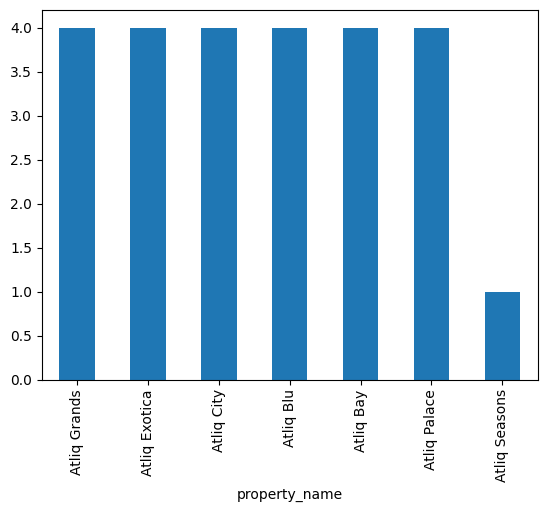

In [ ]:
# visualize the value counts of property_name in dim_hotels.csv
dim_hotels.property_name.value_counts().plot(kind='bar')

<Axes: xlabel='category'>

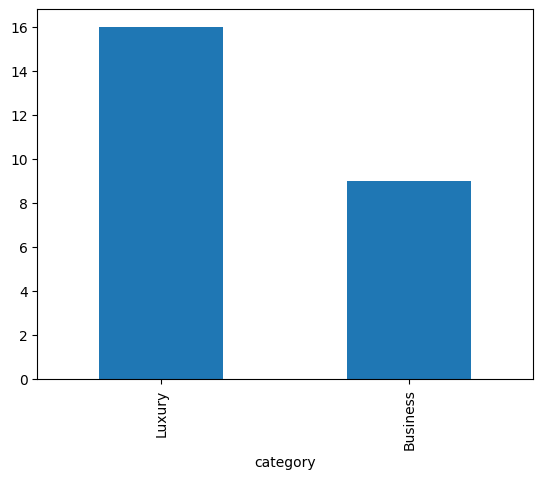

In [ ]:
# visualize the value counts of category in dim_hotels.csv
dim_hotels.category.value_counts().plot(kind='bar')

<Axes: xlabel='city'>

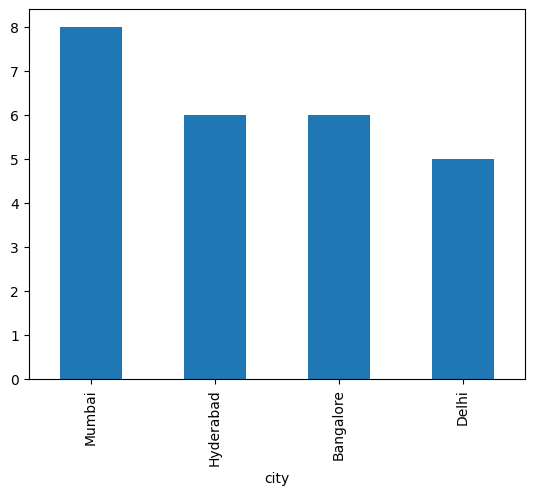

In [ ]:
# visualize the value counts of city in dim_hotels.csv
dim_hotels.city.value_counts().plot(kind='bar')

**3. dim_rooms.csv**

In [ ]:
# display first 5 rows of dim_rooms.csv
dim_rooms.head()

,room_id,room_class
0,RT1,Standard
1,RT2,Elite
2,RT3,Premium
3,RT4,Presidential


**4. fact_aggregated_bookings.csv**

In [ ]:
# displaying the first 5 rows of fact_aggregated_bookings.csv
fact_aggregated_bookings.head()

,property_id,check_in_date,room_category,successful_bookings,capacity
0,16559,01-May-22,RT1,25,30
1,19562,01-May-22,RT1,28,30
2,19563,01-May-22,RT1,23,30
3,17558,01-May-22,RT1,13,19
4,16558,01-May-22,RT1,18,19


In [ ]:
# dimensions of fact_aggregated_bookings.csv
fact_aggregated_bookings.shape

(9200, 5)

In [ ]:
# information of fact_aggregated_bookings.csv
fact_aggregated_bookings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9200 entries, 0 to 9199
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   property_id          9200 non-null   int64 
 1   check_in_date        9200 non-null   object
 2   room_category        9200 non-null   object
 3   successful_bookings  9200 non-null   int64 
 4   capacity             9200 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 359.5+ KB


In [ ]:
# value counts of property_id column in fact_aggregated_bookings.csv
fact_aggregated_bookings.property_id.value_counts()

property_id
16559    368
17559    368
17564    368
19561    368
19559    368
18563    368
18562    368
18561    368
18559    368
18558    368
17563    368
17562    368
16563    368
19562    368
16562    368
16561    368
16560    368
17561    368
19560    368
19558    368
17560    368
16558    368
17558    368
19563    368
18560    368
Name: count, dtype: int64

<Axes: xlabel='room_category'>

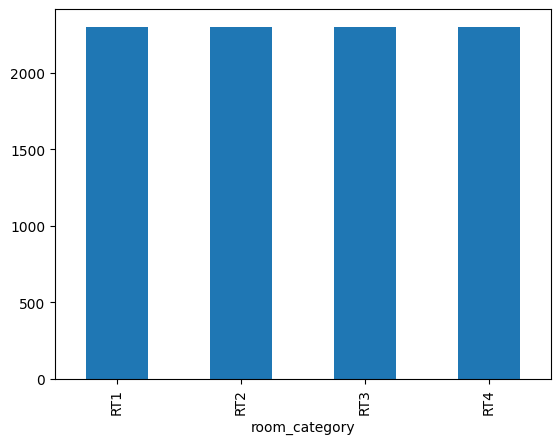

In [ ]:
#visualizing value counts of room_category column in fact_aggregated_bookings.csv
fact_aggregated_bookings.room_category.value_counts().plot(kind='bar')

In [ ]:
# checking for null values in each column
fact_aggregated_bookings.isnull().sum()

property_id            0
check_in_date          0
room_category          0
successful_bookings    0
capacity               0
dtype: int64

**5. fact_bookings.csv**

In [ ]:
# first 5 rows of fact_bookings.csv
fact_bookings.head()

,booking_id,property_id,booking_date,check_in_date,checkout_date,no_guests,room_category,booking_platform,ratings_given,booking_status,revenue_generated,revenue_realized
0,May012216558RT11,16558,2022-04-27,2022-05-01,2022-05-02,3,RT1,direct online,1.0,Checked Out,10010,10010
1,May012216558RT12,16558,2022-04-30,2022-05-01,2022-05-02,2,RT1,others,NaN,Cancelled,9100,3640
2,May012216558RT13,16558,2022-04-28,2022-05-01,2022-05-04,2,RT1,logtrip,5.0,Checked Out,9100,9100
3,May012216558RT14,16558,2022-04-28,2022-05-01,2022-05-02,2,RT1,others,NaN,Cancelled,9100,3640
4,May012216558RT15,16558,2022-04-27,2022-05-01,2022-05-02,4,RT1,direct online,5.0,Checked Out,10920,10920


In [ ]:
# dimensions of fact_bookings.csv
fact_bookings.shape

(134590, 12)

In [ ]:
# information about fact_bookings.csv
fact_bookings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134590 entries, 0 to 134589
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   booking_id         134590 non-null  object 
 1   property_id        134590 non-null  int64  
 2   booking_date       134590 non-null  object 
 3   check_in_date      134590 non-null  object 
 4   checkout_date      134590 non-null  object 
 5   no_guests          134590 non-null  int64  
 6   room_category      134590 non-null  object 
 7   booking_platform   134590 non-null  object 
 8   ratings_given      56683 non-null   float64
 9   booking_status     134590 non-null  object 
 10  revenue_generated  134590 non-null  int64  
 11  revenue_realized   134590 non-null  int64  
dtypes: float64(1), int64(4), object(7)
memory usage: 12.3+ MB


In [ ]:
# checking null values in fact_bookings data frame
fact_bookings.isnull().sum()

booking_id               0
property_id              0
booking_date             0
check_in_date            0
checkout_date            0
no_guests                0
room_category            0
booking_platform         0
ratings_given        77907
booking_status           0
revenue_generated        0
revenue_realized         0
dtype: int64

<Axes: xlabel='ratings_given'>

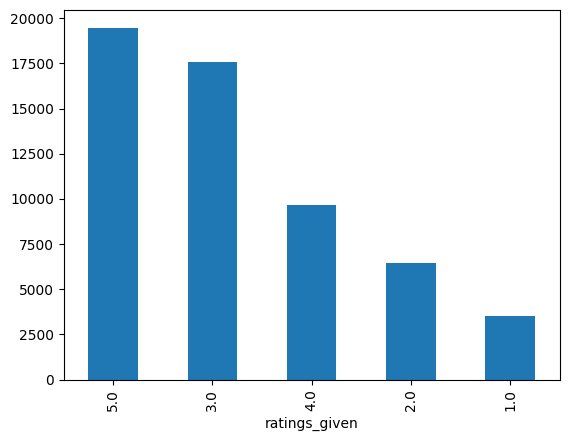

In [ ]:
# visualizing the value counts of ratings_given column in fact_bookings data frame
fact_bookings.ratings_given.value_counts().plot(kind='bar')

<Axes: xlabel='booking_status'>

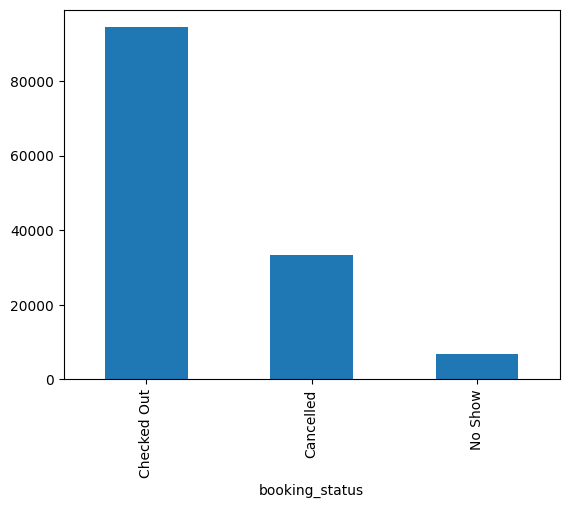

In [ ]:
# visualizing the value counts of booking_status column in fact_bookings data frame
fact_bookings.booking_status.value_counts().plot(kind='bar')

<Axes: xlabel='booking_platform'>

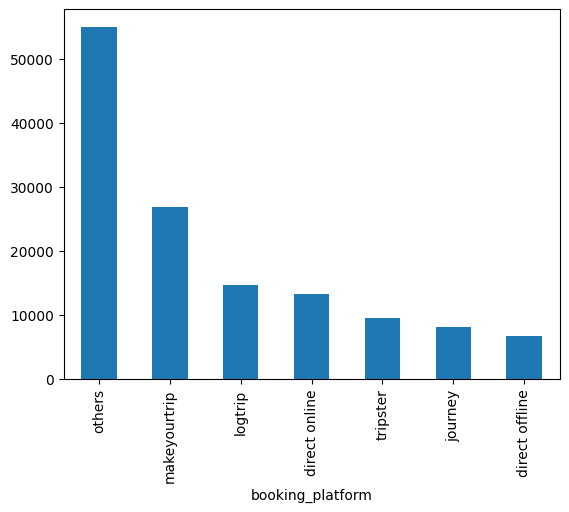

In [ ]:
# visualizing the value counts of booking_platform column in fact_bookings data frame
fact_bookings.booking_platform.value_counts().plot(kind="bar")

In [ ]:
# describing the fact_bookings dataframe
fact_bookings.describe()

,property_id,no_guests,ratings_given,revenue_generated,revenue_realized
count,134590.000000,134590.000000,56683.000000,134590.000000,134590.000000
mean,18061.113493,2.036808,3.619004,14916.013188,12696.123256
std,1093.055847,1.031766,1.235009,6452.868072,6928.108124
min,16558.000000,1.000000,1.000000,6500.000000,2600.000000
25%,17558.000000,1.000000,3.000000,9900.000000,7600.000000
50%,17564.000000,2.000000,4.000000,13500.000000,11700.000000
75%,18563.000000,2.000000,5.000000,18000.000000,15300.000000
max,19563.000000,6.000000,5.000000,45220.000000,45220.000000


In [ ]:
# max,min revenue generated
fact_bookings.revenue_generated.min(),fact_bookings.revenue_generated.max()

(6500, 45220)

# ***Data Cleaning***

**1. fact_bookings Dataframe**

In [ ]:
# Filter the dataset to find bookings where the number of guests is less than zero
fact_bookings[fact_bookings.no_guests<0]

,booking_id,property_id,booking_date,check_in_date,checkout_date,no_guests,room_category,booking_platform,ratings_given,booking_status,revenue_generated,revenue_realized


In [ ]:
#dimension of fact_bookings Dataframe
fact_bookings.shape

(134590, 12)

In [ ]:
# Remove rows where the number of guests is zero or negative
fact_bookings = fact_bookings[fact_bookings.no_guests>0]

In [ ]:
# Calculate the mean (average) and standard deviation of revenue generated
avg , std = fact_bookings.revenue_generated.mean() , fact_bookings.revenue_generated.std()
avg,std

(14916.013188201203, 6452.86807176819)

In [ ]:
# Calculate and display the higher limit for revenue generated, defined as the mean plus three times the standard deviation
higher_limit = avg + 3*std
higher_limit

34274.61740350578

In [ ]:
# Calculate and display the lower limit for revenue generated, defined as the mean minus three times the standard deviation
lower_limit = avg - 3*std
lower_limit

-4442.591027103368

In [ ]:
# Filter the dataset to find bookings where the revenue generated is less than the lower limit
fact_bookings[fact_bookings.revenue_generated<lower_limit]

,booking_id,property_id,booking_date,check_in_date,checkout_date,no_guests,room_category,booking_platform,ratings_given,booking_status,revenue_generated,revenue_realized


In [ ]:
# Find bookings where the revenue generated is greater than the higher limit
fact_bookings[fact_bookings.revenue_generated>higher_limit]

,booking_id,property_id,booking_date,check_in_date,checkout_date,no_guests,room_category,booking_platform,ratings_given,booking_status,revenue_generated,revenue_realized
137,May012216559RT41,16559,2022-04-27,2022-05-01,2022-05-07,4,RT4,others,NaN,Checked Out,38760,38760
139,May012216559RT43,16559,2022-05-01,2022-05-01,2022-05-02,6,RT4,tripster,3.0,Checked Out,45220,45220
143,May012216559RT47,16559,2022-04-28,2022-05-01,2022-05-03,3,RT4,others,5.0,Checked Out,35530,35530
149,May012216559RT413,16559,2022-04-24,2022-05-01,2022-05-07,5,RT4,logtrip,NaN,Checked Out,41990,41990
153,May012216559RT417,16559,2022-04-30,2022-05-01,2022-05-02,4,RT4,others,NaN,Cancelled,38760,15504
...,...,...,...,...,...,...,...,...,...,...,...,...
134467,Jul312219562RT45,19562,2022-07-28,2022-07-31,2022-08-01,6,RT4,makeyourtrip,4.0,Checked Out,39900,39900
134469,Jul312219562RT47,19562,2022-07-10,2022-07-31,2022-08-06,5,RT4,makeyourtrip,NaN,Cancelled,37050,14820
134474,Jul312219562RT412,19562,2022-07-25,2022-07-31,2022-08-06,5,RT4,direct offline,5.0,Checked Out,37050,37050
134581,Jul312217564RT42,17564,2022-07-31,2022-07-31,2022-08-01,4,RT4,makeyourtrip,4.0,Checked Out,38760,38760


In [ ]:
# Remove rows where the revenue generated is greater than the higher limit
fact_bookings = fact_bookings[fact_bookings.revenue_generated < higher_limit]

In [ ]:
fact_bookings.shape

(133070, 12)

In [ ]:
#Imputes missing values in the 'ratings_given' column of the 'fact_bookings' DataFrame with the mean of non-missing values using NumPy's nanmean function.
import numpy as np
fact_bookings['ratings_given'].fillna(np.nanmean(fact_bookings['ratings_given']), inplace=True)


In [ ]:
fact_bookings.isnull().sum()

booking_id           0
property_id          0
booking_date         0
check_in_date        0
checkout_date        0
no_guests            0
room_category        0
booking_platform     0
ratings_given        0
booking_status       0
revenue_generated    0
revenue_realized     0
dtype: int64

**fact_aggregated_bookings Dataframe**

In [ ]:
#describe the dataframe
fact_aggregated_bookings.describe()

,property_id,successful_bookings,capacity
count,9200.000000,9200.000000,9200.000000
mean,18040.640000,14.629348,25.280000
std,1099.818325,7.591770,11.440971
min,16558.000000,1.000000,3.000000
25%,17558.000000,9.000000,18.000000
50%,17564.000000,14.000000,25.000000
75%,18563.000000,19.000000,34.000000
max,19563.000000,43.000000,50.000000


In [ ]:
# check null values
fact_aggregated_bookings.isnull().sum()

property_id            0
check_in_date          0
room_category          0
successful_bookings    0
capacity               0
dtype: int64

In [ ]:
#Filters the 'fact_aggregated_bookings' DataFrame to include rows where the number of 'successful_bookings' is greater than the 'capacity'.
fact_aggregated_bookings[fact_aggregated_bookings.successful_bookings > fact_aggregated_bookings.capacity]

,property_id,check_in_date,room_category,successful_bookings,capacity


# ***Data Transformation***

In [ ]:
fact_aggregated_bookings.head()

,property_id,check_in_date,room_category,successful_bookings,capacity
0,16559,01-May-22,RT1,25,30
1,19562,01-May-22,RT1,28,30
2,19563,01-May-22,RT1,23,30
3,17558,01-May-22,RT1,13,19
4,16558,01-May-22,RT1,18,19


In [ ]:
# occupancy%=total_successfull_bookings/capacity
fact_aggregated_bookings['occupancy%']=(fact_aggregated_bookings.successful_bookings/fact_aggregated_bookings.capacity)*100
fact_aggregated_bookings.head()

,property_id,check_in_date,room_category,successful_bookings,capacity,occupancy%
0,16559,01-May-22,RT1,25,30,83.333333
1,19562,01-May-22,RT1,28,30,93.333333
2,19563,01-May-22,RT1,23,30,76.666667
3,17558,01-May-22,RT1,13,19,68.421053
4,16558,01-May-22,RT1,18,19,94.736842


# ***Merging Data i.e. merging dim_dates, dim_hotels,dim_rooms,fact_aggregated_bookings Dataframes***

In [ ]:
fact_aggregated_bookings.head()

,property_id,check_in_date,room_category,successful_bookings,capacity,occupancy%
0,16559,01-May-22,RT1,25,30,83.333333
1,19562,01-May-22,RT1,28,30,93.333333
2,19563,01-May-22,RT1,23,30,76.666667
3,17558,01-May-22,RT1,13,19,68.421053
4,16558,01-May-22,RT1,18,19,94.736842


In [ ]:
dim_date.head()

,date,mmm yy,week no,day_type,week_number
0,2022-05-01,May 22,W 19,Weekday,19
1,2022-05-02,May 22,W 19,Weekday,19
2,2022-05-03,May 22,W 19,Weekday,19
3,2022-05-04,May 22,W 19,Weekday,19
4,2022-05-05,May 22,W 19,Weekday,19


In [ ]:
dim_rooms.head()

,room_id,room_class
0,RT1,Standard
1,RT2,Elite
2,RT3,Premium
3,RT4,Presidential


In [ ]:
dim_hotels.head()

,property_id,property_name,category,city
0,16558,Atliq Grands,Luxury,Delhi
1,16559,Atliq Exotica,Luxury,Mumbai
2,16560,Atliq City,Business,Delhi
3,16561,Atliq Blu,Luxury,Delhi
4,16562,Atliq Bay,Luxury,Delhi


In [ ]:
#merge fact_aggregated_bookings,dim_rooms Dataframes
df=pd.merge(fact_aggregated_bookings,dim_rooms,left_on="room_category",right_on="room_id")
df.head()

,property_id,check_in_date,room_category,successful_bookings,capacity,occupancy%,room_id,room_class
0,16559,01-May-22,RT1,25,30,83.333333,RT1,Standard
1,19562,01-May-22,RT1,28,30,93.333333,RT1,Standard
2,19563,01-May-22,RT1,23,30,76.666667,RT1,Standard
3,17558,01-May-22,RT1,13,19,68.421053,RT1,Standard
4,16558,01-May-22,RT1,18,19,94.736842,RT1,Standard


In [ ]:
# Merge df, dim_hotels Dataframes
df=pd.merge(dim_hotels,df,on='property_id')
df.head()

,property_id,property_name,category,city,check_in_date,room_category,successful_bookings,capacity,occupancy%,room_id,room_class
0,16558,Atliq Grands,Luxury,Delhi,01-May-22,RT1,18,19,94.736842,RT1,Standard
1,16558,Atliq Grands,Luxury,Delhi,02-May-22,RT1,12,19,63.157895,RT1,Standard
2,16558,Atliq Grands,Luxury,Delhi,03-May-22,RT1,14,19,73.684211,RT1,Standard
3,16558,Atliq Grands,Luxury,Delhi,04-May-22,RT1,13,19,68.421053,RT1,Standard
4,16558,Atliq Grands,Luxury,Delhi,05-May-22,RT1,12,19,63.157895,RT1,Standard


In [ ]:
df['check_in_date'] = pd.to_datetime(df['check_in_date'])
df=pd.merge(df,dim_date,left_on="check_in_date", right_on="date")
df.head()

<ipython-input-59-2766067c1165>:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['check_in_date'] = pd.to_datetime(df['check_in_date'])


,property_id,property_name,category,city,check_in_date,room_category,successful_bookings,capacity,occupancy%,room_id,room_class,date,mmm yy,week no,day_type,week_number
0,16558,Atliq Grands,Luxury,Delhi,2022-05-01,RT1,18,19,94.736842,RT1,Standard,2022-05-01,May 22,W 19,Weekday,19
1,16558,Atliq Grands,Luxury,Delhi,2022-05-01,RT2,21,22,95.454545,RT2,Elite,2022-05-01,May 22,W 19,Weekday,19
2,16558,Atliq Grands,Luxury,Delhi,2022-05-01,RT3,8,8,100.000000,RT3,Premium,2022-05-01,May 22,W 19,Weekday,19
3,16558,Atliq Grands,Luxury,Delhi,2022-05-01,RT4,3,3,100.000000,RT4,Presidential,2022-05-01,May 22,W 19,Weekday,19
4,16559,Atliq Exotica,Luxury,Mumbai,2022-05-01,RT1,25,30,83.333333,RT1,Standard,2022-05-01,May 22,W 19,Weekday,19


In [ ]:
df.drop("room_id",axis=1,inplace=True)
df.head()

,property_id,property_name,category,city,check_in_date,room_category,successful_bookings,capacity,occupancy%,room_class,date,mmm yy,week no,day_type,week_number
0,16558,Atliq Grands,Luxury,Delhi,2022-05-01,RT1,18,19,94.736842,Standard,2022-05-01,May 22,W 19,Weekday,19
1,16558,Atliq Grands,Luxury,Delhi,2022-05-01,RT2,21,22,95.454545,Elite,2022-05-01,May 22,W 19,Weekday,19
2,16558,Atliq Grands,Luxury,Delhi,2022-05-01,RT3,8,8,100.000000,Premium,2022-05-01,May 22,W 19,Weekday,19
3,16558,Atliq Grands,Luxury,Delhi,2022-05-01,RT4,3,3,100.000000,Presidential,2022-05-01,May 22,W 19,Weekday,19
4,16559,Atliq Exotica,Luxury,Mumbai,2022-05-01,RT1,25,30,83.333333,Standard,2022-05-01,May 22,W 19,Weekday,19


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9200 entries, 0 to 9199
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   property_id          9200 non-null   int64         
 1   property_name        9200 non-null   object        
 2   category             9200 non-null   object        
 3   city                 9200 non-null   object        
 4   check_in_date        9200 non-null   datetime64[ns]
 5   room_category        9200 non-null   object        
 6   successful_bookings  9200 non-null   int64         
 7   capacity             9200 non-null   int64         
 8   occupancy%           9200 non-null   float64       
 9   room_class           9200 non-null   object        
 10  date                 9200 non-null   datetime64[ns]
 11  mmm yy               9200 non-null   object        
 12  week no              9200 non-null   object        
 13  day_type             9200 non-nul

# ***Data Ingestion on merged Dataframe df***



**1. How does the occupancy percentage vary across different room classes in the hotel?**

In [ ]:
# class wise occupancy percentage
class_occupancy_per=df.groupby("room_class")['occupancy%'].mean().round(2)

In [ ]:
import plotly.express as px
fig = px.bar(class_occupancy_per,
             title="Class Wise Occupancy Percentage",
             labels={'room_class': 'Room Class', 'occupancy%': 'Occupancy Percentage'},
             color_discrete_sequence=px.colors.qualitative.Prism)
fig.show()

In [ ]:
#Using dataframe fact_aggregated_bookings: suggest a plot using plotly library
import plotly.express as px
fig = px.scatter(df, x="check_in_date", y="occupancy%", color="room_category", title="Occupancy Rate by Room Category and Check-in Date")
fig.show()


***Merging Data i.e. merging dim_dates, dim_hotels,dim_rooms,fact_bookings Dataframes***

In [ ]:
fact_bookings.head()

,booking_id,property_id,booking_date,check_in_date,checkout_date,no_guests,room_category,booking_platform,ratings_given,booking_status,revenue_generated,revenue_realized
0,May012216558RT11,16558,2022-04-27,2022-05-01,2022-05-02,3,RT1,direct online,1.000000,Checked Out,10010,10010
1,May012216558RT12,16558,2022-04-30,2022-05-01,2022-05-02,2,RT1,others,3.617145,Cancelled,9100,3640
2,May012216558RT13,16558,2022-04-28,2022-05-01,2022-05-04,2,RT1,logtrip,5.000000,Checked Out,9100,9100
3,May012216558RT14,16558,2022-04-28,2022-05-01,2022-05-02,2,RT1,others,3.617145,Cancelled,9100,3640
4,May012216558RT15,16558,2022-04-27,2022-05-01,2022-05-02,4,RT1,direct online,5.000000,Checked Out,10920,10920


In [ ]:
#merge fact_aggregated_bookings,dim_rooms Dataframes
df_2=pd.merge(fact_bookings,dim_rooms,left_on="room_category",right_on="room_id")
# Merge df, dim_hotels Dataframes
df_2=pd.merge(dim_hotels,df_2,on='property_id')
df_2['check_in_date'] = pd.to_datetime(df_2['check_in_date'])
df_2=pd.merge(df_2,dim_date,left_on="check_in_date", right_on="date")
df_2.head()


,property_id,property_name,category,city,booking_id,booking_date,check_in_date,checkout_date,no_guests,room_category,...,booking_status,revenue_generated,revenue_realized,room_id,room_class,date,mmm yy,week no,day_type,week_number
0,16558,Atliq Grands,Luxury,Delhi,May012216558RT11,2022-04-27,2022-05-01,2022-05-02,3,RT1,...,Checked Out,10010,10010,RT1,Standard,2022-05-01,May 22,W 19,Weekday,19
1,16558,Atliq Grands,Luxury,Delhi,May012216558RT12,2022-04-30,2022-05-01,2022-05-02,2,RT1,...,Cancelled,9100,3640,RT1,Standard,2022-05-01,May 22,W 19,Weekday,19
2,16558,Atliq Grands,Luxury,Delhi,May012216558RT13,2022-04-28,2022-05-01,2022-05-04,2,RT1,...,Checked Out,9100,9100,RT1,Standard,2022-05-01,May 22,W 19,Weekday,19
3,16558,Atliq Grands,Luxury,Delhi,May012216558RT14,2022-04-28,2022-05-01,2022-05-02,2,RT1,...,Cancelled,9100,3640,RT1,Standard,2022-05-01,May 22,W 19,Weekday,19
4,16558,Atliq Grands,Luxury,Delhi,May012216558RT15,2022-04-27,2022-05-01,2022-05-02,4,RT1,...,Checked Out,10920,10920,RT1,Standard,2022-05-01,May 22,W 19,Weekday,19


In [ ]:
df_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 133070 entries, 0 to 133069
Data columns (total 22 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   property_id        133070 non-null  int64         
 1   property_name      133070 non-null  object        
 2   category           133070 non-null  object        
 3   city               133070 non-null  object        
 4   booking_id         133070 non-null  object        
 5   booking_date       133070 non-null  object        
 6   check_in_date      133070 non-null  datetime64[ns]
 7   checkout_date      133070 non-null  object        
 8   no_guests          133070 non-null  int64         
 9   room_category      133070 non-null  object        
 10  booking_platform   133070 non-null  object        
 11  ratings_given      133070 non-null  float64       
 12  booking_status     133070 non-null  object        
 13  revenue_generated  133070 non-null  int64   

In [ ]:


# Convert booking_date and checkout_date to datetime
df_2['booking_date'] = pd.to_datetime(df_2['booking_date'])
df_2['checkout_date'] = pd.to_datetime(df_2['checkout_date'])

# Add Month and Year
df_2['booking_month'] = df_2['booking_date'].dt.month
df_2['booking_year'] = df_2['booking_date'].dt.year


In [ ]:

# Add Booking Duration
df_2['booking_duration'] = (df_2['checkout_date'] - df_2['check_in_date']).dt.days

In [ ]:

# Add Revenue per Guest
df_2['revenue_per_guest'] = df_2['revenue_generated'] / df_2['no_guests']


In [ ]:

# Add Day of Week
df_2['booking_day_of_week'] = df_2['booking_date'].dt.day_name()


In [ ]:

# Add Booking Lead Time
df_2['lead_time'] = (df_2['check_in_date'] - df_2['booking_date']).dt.days


In [ ]:
df_2.head()

,property_id,property_name,category,city,booking_id,booking_date,check_in_date,checkout_date,no_guests,room_category,...,mmm yy,week no,day_type,week_number,booking_month,booking_year,booking_duration,revenue_per_guest,booking_day_of_week,lead_time
0,16558,Atliq Grands,Luxury,Delhi,May012216558RT11,2022-04-27,2022-05-01,2022-05-02,3,RT1,...,May 22,W 19,Weekday,19,4,2022,1,3336.666667,Wednesday,4
1,16558,Atliq Grands,Luxury,Delhi,May012216558RT12,2022-04-30,2022-05-01,2022-05-02,2,RT1,...,May 22,W 19,Weekday,19,4,2022,1,4550.000000,Saturday,1
2,16558,Atliq Grands,Luxury,Delhi,May012216558RT13,2022-04-28,2022-05-01,2022-05-04,2,RT1,...,May 22,W 19,Weekday,19,4,2022,3,4550.000000,Thursday,3
3,16558,Atliq Grands,Luxury,Delhi,May012216558RT14,2022-04-28,2022-05-01,2022-05-02,2,RT1,...,May 22,W 19,Weekday,19,4,2022,1,4550.000000,Thursday,3
4,16558,Atliq Grands,Luxury,Delhi,May012216558RT15,2022-04-27,2022-05-01,2022-05-02,4,RT1,...,May 22,W 19,Weekday,19,4,2022,1,2730.000000,Wednesday,4


In [ ]:
# Calculate Total Revenue
total_revenue = df_2['revenue_realized'].sum()

# Calculate Total Bookings
total_bookings = len(df_2)

# # Calculate Total Capacity
# occupancy%=df_2.groupby("room_class")['occupancy%'].mean().round(2)

# Calculate Total Successful Bookings
total_successful_bookings = df_2[df_2['booking_status'] == 'Successful']['booking_id'].count()

# Calculate Occupancy %
# occupancy_percentage = (total_successful_bookings / total_capacity) * 100

# Calculate Average Rating
average_rating = df_2['ratings_given'].mean()

# Calculate No of days
total_days = len(pd.date_range(start=df_2['booking_date'].min(), end=df_2['booking_date'].max()))

# Calculate Total Cancelled Bookings
total_cancelled_bookings = df_2[df_2['booking_status'] == 'Cancelled']['booking_id'].count()

# Calculate Cancellation %
cancellation_percentage = (total_cancelled_bookings / total_bookings) * 100

# Calculate Total Checked Out
total_checked_out = df_2[df_2['booking_status'] == 'Checked Out']['booking_id'].count()

# Calculate Total No Show Bookings
total_no_show_bookings = df_2[df_2['booking_status'] == 'No Show']['booking_id'].count()

# Calculate No Show rate %
no_show_rate_percentage = (total_no_show_bookings / total_bookings) * 100

# Calculate ADR (Average Daily Rate)
adr = total_revenue / total_successful_bookings

# Calculate Realisation %
realisation_percentage = (total_checked_out / total_bookings) * 100

# Calculate RevPAR (Revenue Per Available Room)
# revpar = total_revenue / total_capacity

# Calculate DBRN (Daily Booked Room Nights)
dbrn = total_successful_bookings / total_days

# Calculate DSRN (Daily Sellable Room Nights)
# dsrn = total_capacity / total_days

# Calculate DURN (Daily Utilized Room Nights)
durn = total_checked_out / total_days


# Calculate WoW Changes
revpw = df_2[df_2['week_number'] == 'previous']['revenue_realized'].sum()
revcw = df_2[df_2['week_number'] == 'current']['revenue_realized'].sum()

# revenue_wow_change_percentage = ((revcw - revpw) / revpw) * 100

# Similarly calculate WoW changes for other metrics like Occupancy, ADR, RevPAR, Realisation, DSRN, etc.

# Add these metrics as columns to the DataFrame
hotel_metrics = {
    'Total Revenue': total_revenue,
    'Total Bookings': total_bookings,
    # 'Total Capacity': total_capacity,
    'Total Successful Bookings': total_successful_bookings,
    # 'Occupancy %': occupancy_percentage,
    'Average Rating': average_rating,
    'No of days': total_days,
    'Total Cancelled Bookings': total_cancelled_bookings,
    'Cancellation %': cancellation_percentage,
    'Total Checked Out': total_checked_out,
    'Total No Show Bookings': total_no_show_bookings,
    'No Show rate %': no_show_rate_percentage,
    'ADR': adr,
    'Realisation %': realisation_percentage,
    # 'RevPAR': revpar,
    'DBRN': dbrn,
    # 'DSRN': dsrn,
    'DURN': durn,
    # 'Revenue WoW change %': revenue_wow_change_percentage
}

# Assuming you want to add these metrics as new columns to your existing DataFrame
for metric, value in hotel_metrics.items():
  df_2[metric] = value
df_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 133070 entries, 0 to 133069
Data columns (total 42 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   property_id                133070 non-null  int64         
 1   property_name              133070 non-null  object        
 2   category                   133070 non-null  object        
 3   city                       133070 non-null  object        
 4   booking_id                 133070 non-null  object        
 5   booking_date               133070 non-null  datetime64[ns]
 6   check_in_date              133070 non-null  datetime64[ns]
 7   checkout_date              133070 non-null  datetime64[ns]
 8   no_guests                  133070 non-null  int64         
 9   room_category              133070 non-null  object        
 10  booking_platform           133070 non-null  object        
 11  ratings_given              133070 non-null  float64 

<ipython-input-75-2dfbf05f0d02>:38: RuntimeWarning:

divide by zero encountered in scalar divide



In [ ]:
#df_2.drop('Revenue WoW change %',axis=1,inplace=True)

In [ ]:
df_2.head()

,property_id,property_name,category,city,booking_id,booking_date,check_in_date,checkout_date,no_guests,room_category,...,No of days,Total Cancelled Bookings,Cancellation %,Total Checked Out,Total No Show Bookings,No Show rate %,ADR,Realisation %,DBRN,DURN
0,16558,Atliq Grands,Luxury,Delhi,May012216558RT11,2022-04-27,2022-05-01,2022-05-02,3,RT1,...,116,33041,24.829789,93335,6694,5.030435,inf,70.139776,0.0,804.612069
1,16558,Atliq Grands,Luxury,Delhi,May012216558RT12,2022-04-30,2022-05-01,2022-05-02,2,RT1,...,116,33041,24.829789,93335,6694,5.030435,inf,70.139776,0.0,804.612069
2,16558,Atliq Grands,Luxury,Delhi,May012216558RT13,2022-04-28,2022-05-01,2022-05-04,2,RT1,...,116,33041,24.829789,93335,6694,5.030435,inf,70.139776,0.0,804.612069
3,16558,Atliq Grands,Luxury,Delhi,May012216558RT14,2022-04-28,2022-05-01,2022-05-02,2,RT1,...,116,33041,24.829789,93335,6694,5.030435,inf,70.139776,0.0,804.612069
4,16558,Atliq Grands,Luxury,Delhi,May012216558RT15,2022-04-27,2022-05-01,2022-05-02,4,RT1,...,116,33041,24.829789,93335,6694,5.030435,inf,70.139776,0.0,804.612069


In [ ]:
df_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 133070 entries, 0 to 133069
Data columns (total 42 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   property_id                133070 non-null  int64         
 1   property_name              133070 non-null  object        
 2   category                   133070 non-null  object        
 3   city                       133070 non-null  object        
 4   booking_id                 133070 non-null  object        
 5   booking_date               133070 non-null  datetime64[ns]
 6   check_in_date              133070 non-null  datetime64[ns]
 7   checkout_date              133070 non-null  datetime64[ns]
 8   no_guests                  133070 non-null  int64         
 9   room_category              133070 non-null  object        
 10  booking_platform           133070 non-null  object        
 11  ratings_given              133070 non-null  float64 

In [ ]:
df_2['mmm yy'].value_counts()

mmm yy
May 22    45380
Jul 22    44524
Jun 22    43166
Name: count, dtype: int64

# **Data Visualization** #

In [ ]:
# Group DataFrame by 'weekno' and calculate total revenue for each week
weekly_revenue = df_2.groupby('week no')['revenue_realized'].sum().reset_index()
# Create a line plot for revenue over time per week
fig = go.Figure()
fig.add_trace(go.Scatter(x=weekly_revenue['week no'], y=weekly_revenue['revenue_realized'], mode='lines', name='Revenue'))
fig.update_layout(title='Revenue Over Time per Week', xaxis_title='Week Number', yaxis_title='Revenue')
fig.show()

In [ ]:
# Create a box plot for booking duration vs revenue generated
fig = go.Figure()
fig.add_trace(go.Box(x=df_2['booking_duration'], y=df_2['revenue_generated'], name='Booking Duration vs Revenue'))
fig.update_layout(title='Booking Duration vs. Revenue Generated', xaxis_title='Booking Duration', yaxis_title='Revenue Generated')
fig.show()

In [ ]:

# Calculate ADR (Average Daily Rate) per Room Category
df_2["ADR"] = df_2["Total Revenue"] / df_2["No of days"]
df_grouped = df_2.groupby('room_category')['ADR'].mean().reset_index()

# Create a plotly bar chart
fig = px.bar(df_grouped, x='room_category', y='ADR', title='Average Daily Rate by Room Category')

# Display the chart
fig.show()


In [ ]:
#  Cancellation Rate Over Time
# Select columns for the plot
cancellation_rate_data = df_2[['date', 'Cancellation %']]

# Create the scatter plot
fig = px.scatter(cancellation_rate_data, x='date', y='Cancellation %', title='Cancellation Rate Over Time')

# Optional s (customize as needed)
fig.update_layout(xaxis_title='Date', yaxis_title='Cancellation Rate (%)')
fig.update_traces(marker_line_color='darkgray', marker_line_width=1)

# Display the plot
fig.show()


In [ ]:
#  Revenue Distribution by Booking Platform

# Group data by Booking Platform and calculate total revenue
df_grouped = df_2.groupby('booking_platform')['Total Revenue'].sum().reset_index()

# Create a plotly pie chart
fig = px.pie(df_grouped, values='Total Revenue', names='booking_platform', title='Revenue Distribution by Booking Platform')

# Display the chart
fig.show()


In [ ]:
#  Room Class Distribution of Bookings

# Count bookings by Room Class
df_grouped = df_2['room_class'].value_counts().reset_index(name='Count')

# Create a plotly bar chart
fig = px.bar(df_grouped, x='room_class', y='Count', title='Room Class Distribution of Bookings')

# Display the chart with rotation on x-axis labels for better readability with many categories
fig.update_xaxes(tickangle=45)  # Adjust angle if needed based on number of room classes
fig.show()


In [ ]:
#  Rating Distribution

# Assuming a ratings column named 'ratings_given'
ratings_data = df_2['ratings_given']

# Create a plotly histogram with informative labels and title
fig = px.histogram(ratings_data, title='Ratings Distribution')

# Customize the axis labels for clarity
fig.update_xaxes(title_text='Rating')
fig.update_yaxes(title_text='Number of Bookings')

# Display the chart
fig.show()


In [ ]:
# Revenue per Guest vs. Ratings Given

# Assuming columns named 'revenue_per_guest' and 'ratings_given'
fig = px.scatter(df_2, x='ratings_given', y='revenue_per_guest', title='Revenue per Guest vs. Ratings Given')

# Display the chart with informative axis labels
fig.update_xaxes(title_text='Ratings Given')
fig.update_yaxes(title_text='Revenue per Guest')
fig.show()


 Box plot showing the distribution of occupancy percentages for each room category.

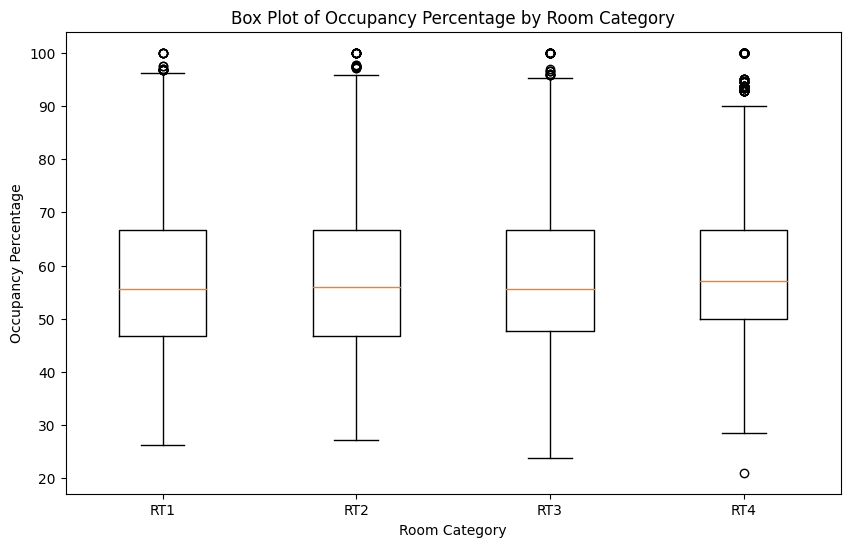

In [ ]:
plt.figure(figsize=(10, 6))
plt.boxplot(x = [df['occupancy%'][df['room_category'] == i] for i in df['room_category'].unique()], labels = df['room_category'].unique())
plt.xlabel('Room Category')
plt.ylabel('Occupancy Percentage')
plt.title('Box Plot of Occupancy Percentage by Room Category')
plt.show()

In [ ]:
#Occupancy Percantage Distribution
fig = px.histogram(df, x='occupancy%', title='Occupancy Percentage Distribution')
fig.show()

In [ ]:
#Successful Bookings by Room Category and City
fig = px.bar(df, x='room_category', y='successful_bookings', color='city', title='Successful Bookings by Room Category and City')
fig.show()

In [ ]:
#Plot successful bookings vs. capacity by room class
fig = px.scatter(df, x='capacity', y='successful_bookings', color='room_class', title='Successful Bookings vs. Capacity by Room Class')
fig.show()


In [ ]:
#Plot occupancy percentage over time by property
fig = px.line(df, x='date', y='occupancy%', color='property_name', title='Occupancy Percentage Over Time by Property')
fig.show()


In [ ]:
#Plot occupancy percentage distribution by room class and city
fig = px.box(df, x='room_class', y='occupancy%', color='city', title='Occupancy Percentage Distribution by Room Class and City')
fig.show()

In [ ]:
# Assuming heatmap_data is already defined
heatmap_data = df.pivot_table(index='city', columns='room_category', values='successful_bookings', aggfunc='sum')

# Define a custom color scale with red, black, and orange
custom_color_scale = [
    [0, 'red'],
    [0.5, 'black'],
    [1, 'orange']
]

# Create the heatmap with the custom color scale
fig2 = px.imshow(heatmap_data, aspect='auto', color_continuous_scale=custom_color_scale, title='Successful Bookings Heatmap')
fig2.show()

In [ ]:
#line graph showing the trend of successful bookings for each day type (Weekday vs. Weekend) across different cities using ploly

fig = px.line(df, x="date", y="successful_bookings", color="day_type", line_dash="day_type",
              title="Trend of Successful Bookings by Day Type and City")
fig.update_layout(xaxis_title="Date", yaxis_title="Successful Bookings",
                  legend_title="Day Type")
fig.show()


In [ ]:
#Occupancy Rates vs. Capacity Across Cities 3D Visualization
fig = px.scatter_3d(df, x='city', y='capacity', z='occupancy%', color='occupancy%',
                    title='Occupancy Rates vs. Capacity Across Cities',
                    color_continuous_scale='Viridis')
fig.update_layout(scene=dict(xaxis_title='City', yaxis_title='Capacity', zaxis_title='Occupancy Percentage'))
fig.show()


In [ ]:
#Booking Success Rates by Room Category
fig = px.sunburst(df, path=['category', 'room_category'], values='successful_bookings',
                  title='Booking Success Rates by Room Category')
fig.update_layout(coloraxis_showscale=False)
fig.show()


In [ ]:
# Booking Success by Occupancy, Capacity, & Category
fig = px.scatter_3d(df, x='occupancy%', y='successful_bookings', z='capacity', color='category',
                    title='Booking Success by Occupancy, Capacity, & Category',
                    labels={
                        'occupancy%': 'Occupancy Percentage',
                        'successful_bookings': 'Successful Bookings',
                        'capacity': 'Capacity'
                    })
fig.update_layout(scene = dict(
                    xaxis_title='Occupancy Percentage',
                    yaxis_title='Successful Bookings',
                    zaxis_title='Capacity'))

fig.show()